In [5]:
%pip install pandas matplotlib seaborn scikit-learn numpy


Note: you may need to restart the kernel to use updated packages.


In [2]:
%pip install streamlit

     --------------------------------------- 23.4/23.4 MB 13.6 MB/s eta 0:00:00
     -------------------------------------- 207.3/207.3 kB 3.1 MB/s eta 0:00:00
     ---------------------------------------- 97.9/97.9 kB 2.8 MB/s eta 0:00:00
     -------------------------------------- 434.5/434.5 kB 5.4 MB/s eta 0:00:00
     --------------------------------------- 25.1/25.1 MB 12.1 MB/s eta 0:00:00
     ---------------------------------------- 79.1/79.1 kB 2.2 MB/s eta 0:00:00
     ---------------------------------------- 64.9/64.9 kB 1.7 MB/s eta 0:00:00
     -------------------------------------- 731.2/731.2 kB 5.8 MB/s eta 0:00:00
     -------------------------------------- 242.4/242.4 kB 3.7 MB/s eta 0:00:00
     ---------------------------------------- 6.9/6.9 MB 7.3 MB/s eta 0:00:00
     ---------------------------------------- 88.5/88.5 kB 4.9 MB/s eta 0:00:00
     -------------------------------------- 133.3/133.3 kB 4.0 MB/s eta 0:00:00
     -------------------------------------

  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


In [6]:
import streamlit as st
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np


Step 1: Load and concatenate data from multiple CSV files

In [2]:
air_quality_data_set_file_paths = [
    r'C:\Users\Acer\Desktop\st20310459\P_data_analysis_st20310459\beijing+multi+site+air+quality+data\data\data_air_control\PRSA_Data_Aotizhongxin_20130301-20170228.csv',
    r"C:\Users\Acer\Desktop\st20310459\P_data_analysis_st20310459\beijing+multi+site+air+quality+data\data\data_air_control\PRSA_Data_Changping_20130301-20170228.csv",
    r'C:\Users\Acer\Desktop\st20310459\P_data_analysis_st20310459\beijing+multi+site+air+quality+data\data\data_air_control\PRSA_Data_Dingling_20130301-20170228.csv',
    r'C:\Users\Acer\Desktop\st20310459\P_data_analysis_st20310459\beijing+multi+site+air+quality+data\data\data_air_control\PRSA_Data_Dongsi_20130301-20170228.csv',
    r'C:\Users\Acer\Desktop\st20310459\P_data_analysis_st20310459\beijing+multi+site+air+quality+data\data\data_air_control\PRSA_Data_Guanyuan_20130301-20170228.csv',
    r"C:\Users\Acer\Desktop\st20310459\P_data_analysis_st20310459\beijing+multi+site+air+quality+data\data\data_air_control\PRSA_Data_Gucheng_20130301-20170228.csv",
    r"C:\Users\Acer\Desktop\st20310459\P_data_analysis_st20310459\beijing+multi+site+air+quality+data\data\data_air_control\PRSA_Data_Huairou_20130301-20170228.csv",
    r"C:\Users\Acer\Desktop\st20310459\P_data_analysis_st20310459\beijing+multi+site+air+quality+data\data\data_air_control\PRSA_Data_Nongzhanguan_20130301-20170228.csv",
    r"C:\Users\Acer\Desktop\st20310459\P_data_analysis_st20310459\beijing+multi+site+air+quality+data\data\data_air_control\PRSA_Data_Shunyi_20130301-20170228.csv",
    r"C:\Users\Acer\Desktop\st20310459\P_data_analysis_st20310459\beijing+multi+site+air+quality+data\data\data_air_control\PRSA_Data_Tiantan_20130301-20170228.csv",
    r"C:\Users\Acer\Desktop\st20310459\P_data_analysis_st20310459\beijing+multi+site+air+quality+data\data\data_air_control\PRSA_Data_Wanliu_20130301-20170228.csv",
    r"C:\Users\Acer\Desktop\st20310459\P_data_analysis_st20310459\beijing+multi+site+air+quality+data\data\data_air_control\PRSA_Data_Wanshouxigong_20130301-20170228.csv"
]

In [7]:
data_set_frames = [pd.read_csv(file) for file in air_quality_data_set_file_paths]
df = pd.concat(data_set_frames)

Step 2: Get an overview of the data

In [8]:
print("How much number of row and colum is there in dataset:", df.shape)
print("\nAs well as how much Data Types and Non-null Counts in dataset:")

How much number of row and colum is there in dataset: (420768, 18)

As well as how much Data Types and Non-null Counts in dataset:


tep 3:Find the rows number of the dataset

In [9]:
df.info()
print("\nFirst Few Rows of the Dataset:")

<class 'pandas.core.frame.DataFrame'>
Index: 420768 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   No       420768 non-null  int64  
 1   year     420768 non-null  int64  
 2   month    420768 non-null  int64  
 3   day      420768 non-null  int64  
 4   hour     420768 non-null  int64  
 5   PM2.5    412029 non-null  float64
 6   PM10     414319 non-null  float64
 7   SO2      411747 non-null  float64
 8   NO2      408652 non-null  float64
 9   CO       400067 non-null  float64
 10  O3       407491 non-null  float64
 11  TEMP     420370 non-null  float64
 12  PRES     420375 non-null  float64
 13  DEWP     420365 non-null  float64
 14  RAIN     420378 non-null  float64
 15  wd       418946 non-null  object 
 16  WSPM     420450 non-null  float64
 17  station  420768 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 61.0+ MB

First Few Rows of the Dataset:


tep 4:Find the statistics value

In [10]:
print(df.head())
print("\nThe value of  Statistics contain:")
print(df.describe())

   No  year  month  day  hour  PM2.5  PM10   SO2   NO2     CO    O3  TEMP  \
0   1  2013      3    1     0    4.0   4.0   4.0   7.0  300.0  77.0  -0.7   
1   2  2013      3    1     1    8.0   8.0   4.0   7.0  300.0  77.0  -1.1   
2   3  2013      3    1     2    7.0   7.0   5.0  10.0  300.0  73.0  -1.1   
3   4  2013      3    1     3    6.0   6.0  11.0  11.0  300.0  72.0  -1.4   
4   5  2013      3    1     4    3.0   3.0  12.0  12.0  300.0  72.0  -2.0   

     PRES  DEWP  RAIN   wd  WSPM       station  
0  1023.0 -18.8   0.0  NNW   4.4  Aotizhongxin  
1  1023.2 -18.2   0.0    N   4.7  Aotizhongxin  
2  1023.5 -18.2   0.0  NNW   5.6  Aotizhongxin  
3  1024.5 -19.4   0.0   NW   3.1  Aotizhongxin  
4  1025.2 -19.5   0.0    N   2.0  Aotizhongxin  

The value of  Statistics contain:
                  No           year          month            day  \
count  420768.000000  420768.000000  420768.000000  420768.000000   
mean    17532.500000    2014.662560       6.522930      15.729637   
s

Step 5: Checking the missing value of data set which is contain in the bejing data set which mainly contain the air quality data 

In [11]:
Air_quality_missing_values = df.isnull().sum()
print("\nFinding missing air quality data  Values in Each Column Before Handling the data set:")
print(Air_quality_missing_values[Air_quality_missing_values > 0])


Finding missing air quality data  Values in Each Column Before Handling the data set:
PM2.5     8739
PM10      6449
SO2       9021
NO2      12116
CO       20701
O3       13277
TEMP       398
PRES       393
DEWP       403
RAIN       390
wd        1822
WSPM       318
dtype: int64


Step 5:Try to  handling the missing value 

In [12]:
def handle_missing_air_quality_data_values(column):
    different_type_of_case_value = {
        'float64': lambda col: col.interpolate(method='linear'),
        'int64': lambda col: col.interpolate(method='linear'),
        'object': lambda col: col.fillna(col.mode()[0]),
    }
    return different_type_of_case_value.get(str(column.dtype), lambda col: col)(column)

using for loop for calculating the missing value after handling of missing value 

In [13]:
for air_quality_column in df.columns:
    df[air_quality_column] = handle_missing_air_quality_data_values(df[air_quality_column])
air_quality_total_missing_after_calculating = df.isnull().sum().sum()
print("\nCalculating the total Missing Values After Handling of missing value :", air_quality_total_missing_after_calculating)


Calculating the total Missing Values After Handling of missing value : 0


Step 6: removing the duplicating value in air quality control of pollution

In [14]:
df.drop_duplicates(inplace=True)

From this step duplicated value will be remove 

In [15]:
duplicates_Value_after_column = df.duplicated().sum()
print("Find the number of Duplicates air quality control value After Removing the air quality value :\n", duplicates_Value_after_column) 

Find the number of Duplicates air quality control value After Removing the air quality value :
 0


Step 7: find the number of column value 

In [16]:
data_air_control_columns_to_check = {'year', 'month', 'day', 'hour'}
index = 0
data_air_control_columns_list = list(df.columns)

In [17]:
while index < len(data_air_control_columns_list):
    if data_air_control_columns_to_check.issubset(data_air_control_columns_list):
      
        df['air_quality_data_value_datetime'] = pd.to_datetime(df[['year', 'month', 'day', 'hour']])
        df.set_index('air_quality_data_value_datetime', inplace=True)
        break  
    index += 1

In [18]:
print("\nPreprocessing the value")


Preprocessing the value


Step 8:find the names of  column 

In [19]:
index = 0
while index < len(df.columns):
    col = df.columns[index]
    df.rename(columns={col: col.lower().replace(" ", "_")}, inplace=True)
    index += 1

Step 9: Output the shape of the dataframe

In [20]:
print("\nFinding  the air quality data set find the number of rows and columns:", df.shape)


Finding  the air quality data set find the number of rows and columns: (420768, 18)


Step 9: Handle Outliers 

In [21]:
air_quality_pollutant_columns = [col for col in df.columns if 'pm' in col or 'pollutant' in col]
print("Finding the missing values in the final result dataset value:\n", df.isnull().sum().sum())

Finding the missing values in the final result dataset value:
 0


In [19]:
for col in air_quality_pollutant_columns:
    df = df[df[col] <= 500] 
print("Find the Sample dataset for air pollution:\n", df.head())

Find the Sample dataset for air pollution:
                                  no  year  month  day  hour  pm2.5  pm10  \
air_quality_data_value_datetime                                            
2013-03-01 00:00:00               1  2013      3    1     0    4.0   4.0   
2013-03-01 01:00:00               2  2013      3    1     1    8.0   8.0   
2013-03-01 02:00:00               3  2013      3    1     2    7.0   7.0   
2013-03-01 03:00:00               4  2013      3    1     3    6.0   6.0   
2013-03-01 04:00:00               5  2013      3    1     4    3.0   3.0   

                                  so2   no2     co    o3  temp    pres  dewp  \
air_quality_data_value_datetime                                                
2013-03-01 00:00:00               4.0   7.0  300.0  77.0  -0.7  1023.0 -18.8   
2013-03-01 01:00:00               4.0   7.0  300.0  77.0  -1.1  1023.2 -18.2   
2013-03-01 02:00:00               5.0  10.0  300.0  73.0  -1.1  1023.5 -18.2   
2013-03-01 03:00:00    

Ow find the different type of graph

In [22]:
histogram = df.select_dtypes(include=['float64', 'int64']).columns

Box plot

In [23]:
Box = df.select_dtypes(include=['float64', 'int64']).columns

Initialize the index for the while loop

In [24]:
index_value = 0

Iterate through the numeric columns

In [25]:
while index_value < len(histogram):
    value = histogram[index_value]  # Use index_value here
    
    # Plot the histogram
    plt.figure(figsize=(10, 5))
    sns.histplot(df[value], bins=30, kde=True)
    plt.title(f'Find the Histogram of given air quality {value}')
    plt.xlabel(value)
    plt.ylabel('Frequency')
    plt.show()
    
    # Increment the index
    index_value += 1  # Use index_value here

C:\Users\Acer\AppData\Local\Temp\ipykernel_17148\3234491387.py:10: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()
C:\Users\Acer\AppData\Local\Temp\ipykernel_17148\3234491387.py:10: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()
C:\Users\Acer\AppData\Local\Temp\ipykernel_17148\3234491387.py:10: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()
C:\Users\Acer\AppData\Local\Temp\ipykernel_17148\3234491387.py:10: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()
C:\Users\Acer\AppData\Local\Temp\ipykernel_17148\3234491387.py:10: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()
C:\Users\Acer\AppData\Local\Temp\ipykernel_17148\3234491387.py:10: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()
C:\Users\Acer\AppData\Local\Temp\ipykernel_17148\3234491387.py:10: UserWarni

Box Plots for Outlier Detection

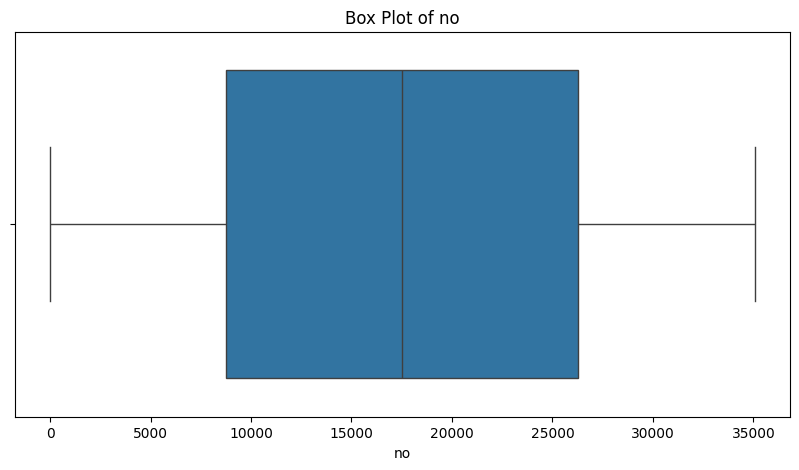

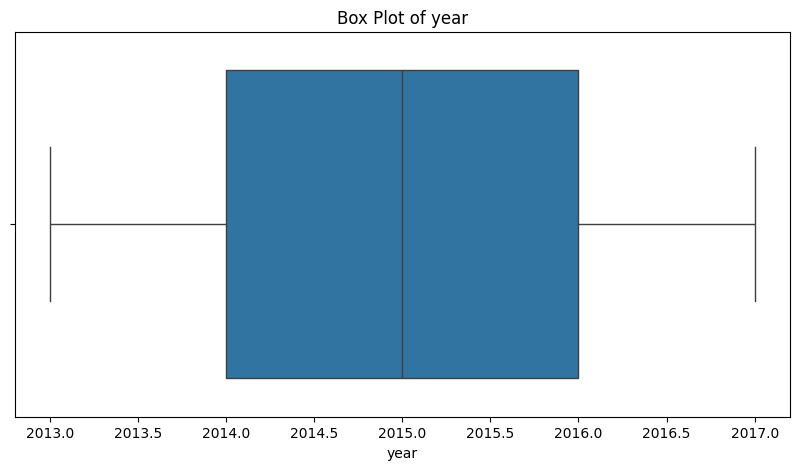

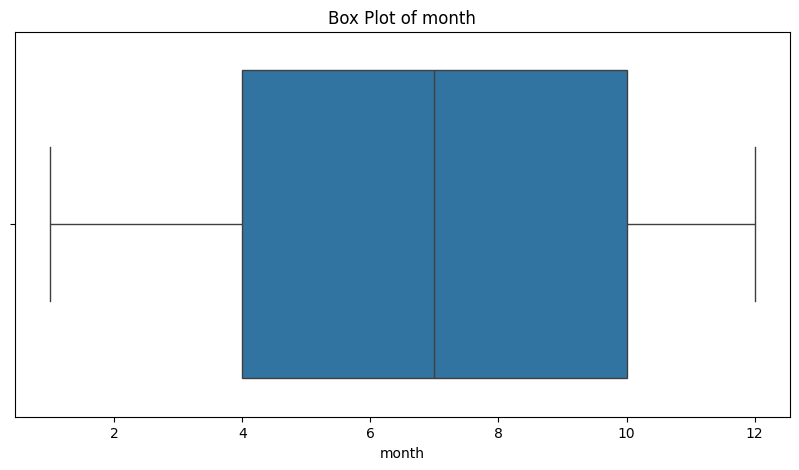

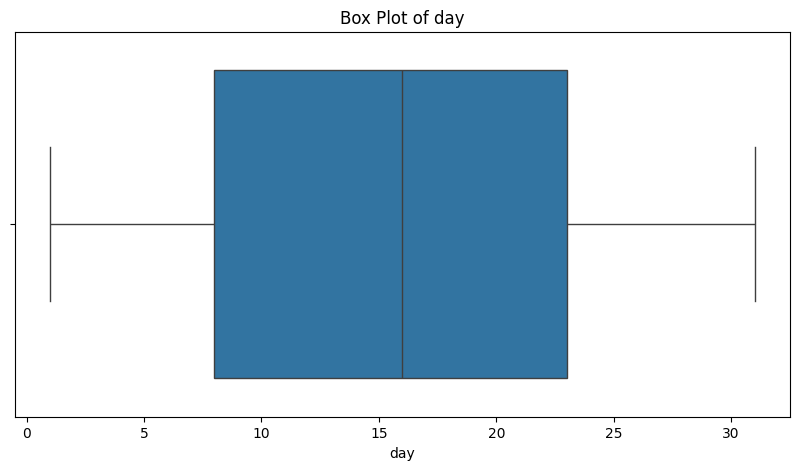

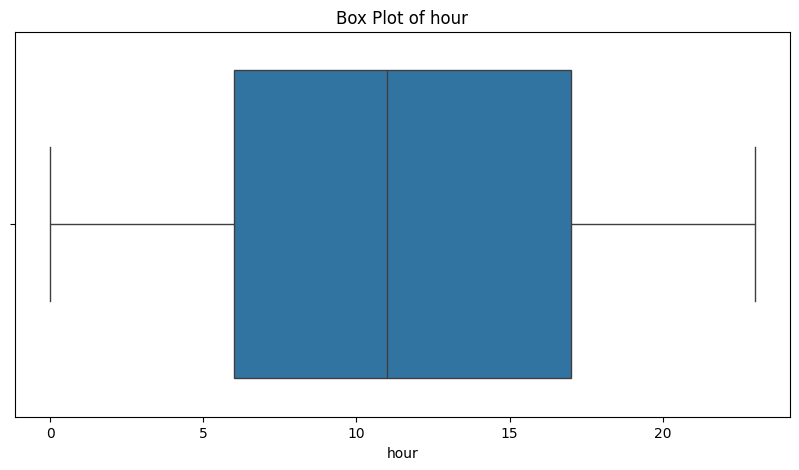

...

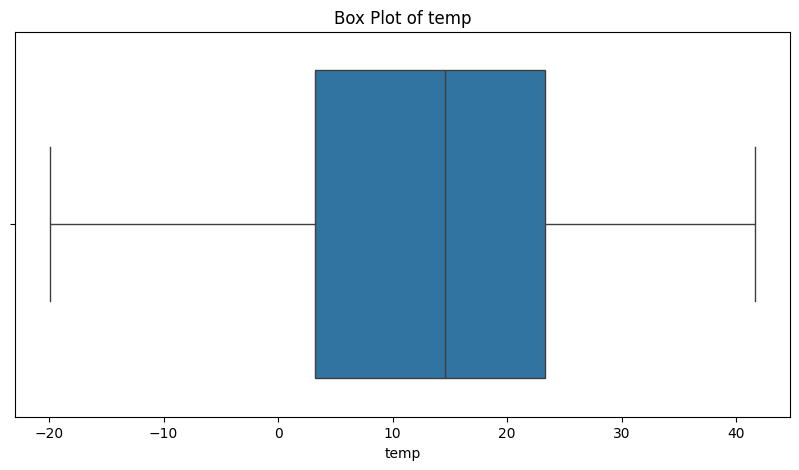

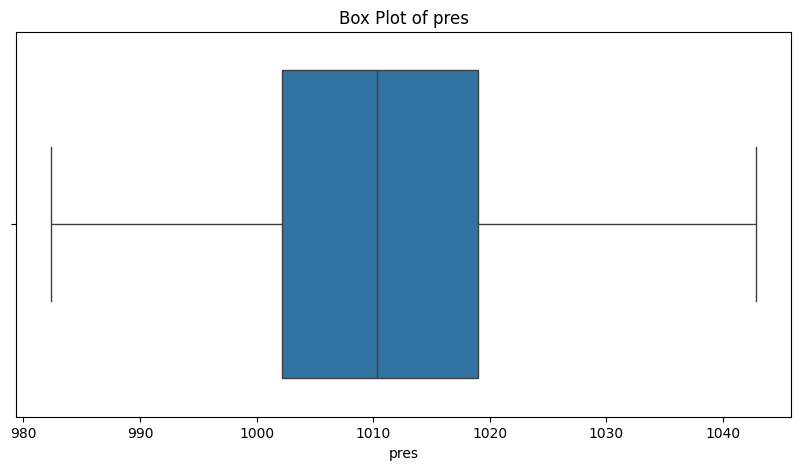

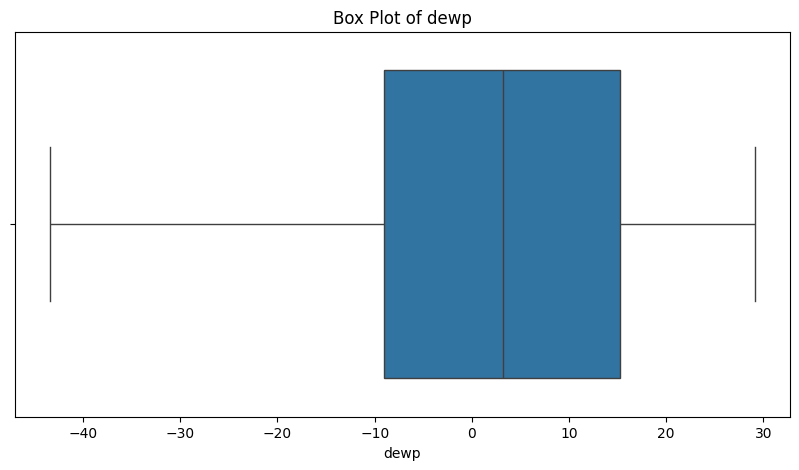

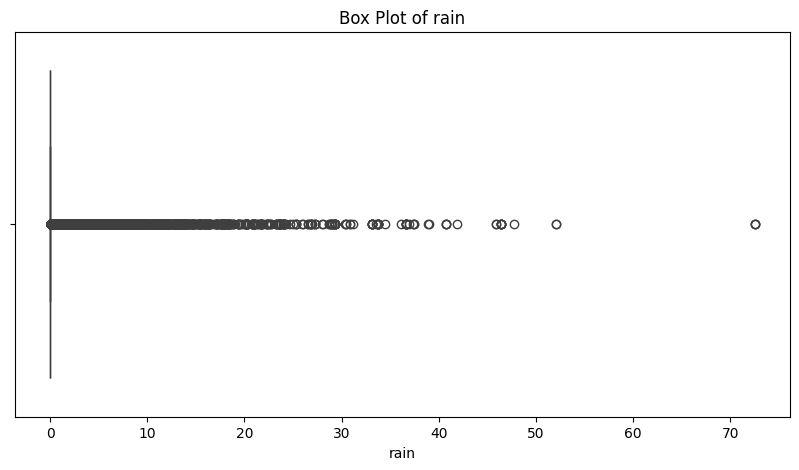

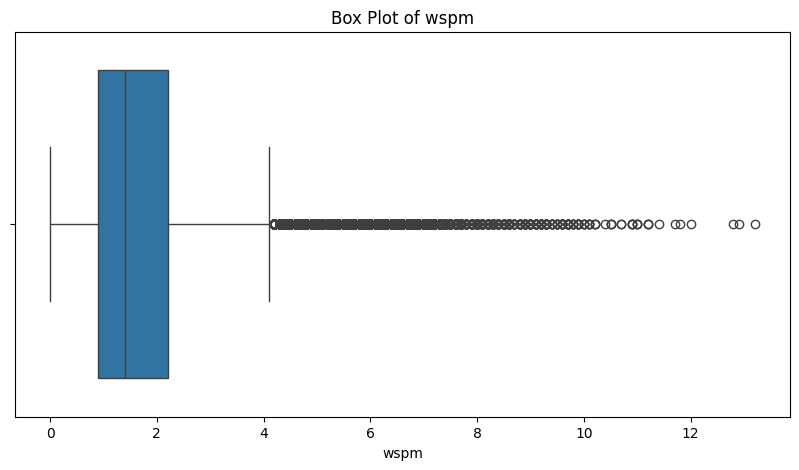

In [24]:
for Box_plot_column in Box:
    plt.figure(figsize=(10, 5))
    sns.boxplot(x=df[Box_plot_column])
    plt.title(f'Box Plot of {Box_plot_column}')
    plt.xlabel(Box_plot_column)
    plt.show()

Now comparing the vlaue 

In [26]:
air_quality_data_x_column = 'pm2.5' 
air_quality_data_y_column = 'pm10'   
# Check for numeric columns
air_quality_data_numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
print("Find the Numeric columns of air quality control :", air_quality_data_numeric_columns)

Find the Numeric columns of air quality control : Index(['no', 'year', 'month', 'day', 'hour', 'pm2.5', 'pm10', 'so2', 'no2',
       'co', 'o3', 'temp', 'pres', 'dewp', 'rain', 'wspm'],
      dtype='object')


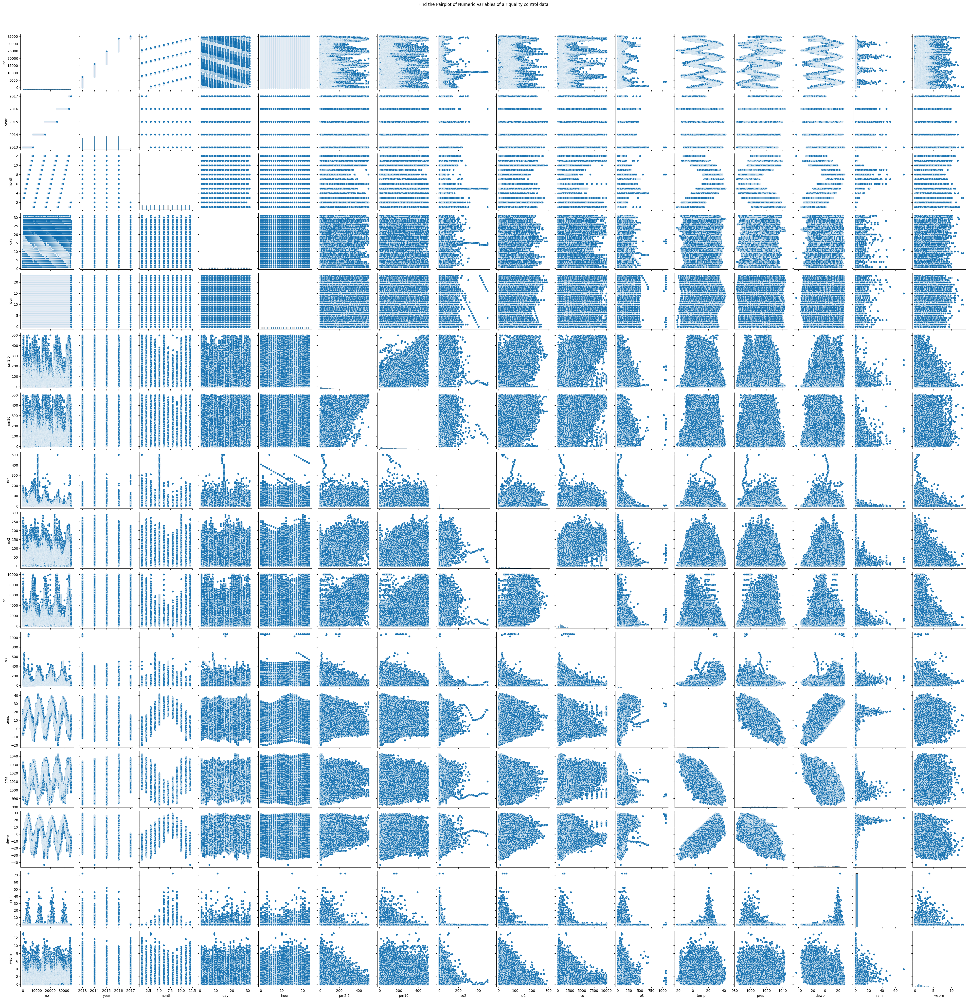

In [26]:
sns.pairplot(df[air_quality_data_numeric_columns])
plt.suptitle('Find the Pairplot of Numeric Variables of air quality control data ', y=1.02)
plt.show()

In [27]:
air_quality_data_x_column = 'pm2.5'
air_quality_data_y_column = 'pm10'  
# Try to find the bar chart 
plt.figure(figsize=(12, 6))
sns.barplot(data=df, x=air_quality_data_x_column, y=air_quality_data_y_column, estimator=sum)
plt.title('Find the Bar Chart of PM2.5 vs PM10')
plt.xticks(rotation=45)
plt.xlabel('PM2.5 air quality control data  Levels')
plt.ylabel('PM10 air quality control data  Levels')
plt.show()

C:\Users\Acer\AppData\Local\Temp\ipykernel_17148\637273515.py:10: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


Statistical summary value for getting the air quality 

In [28]:
air_pollution_data_value = df.describe(include='all')  
print(air_pollution_data_value)

                   no           year          month            day  \
count   418643.000000  418643.000000  418643.000000  418643.000000   
unique            NaN            NaN            NaN            NaN   
top               NaN            NaN            NaN            NaN   
freq              NaN            NaN            NaN            NaN   
mean     17512.856006    2014.660028       6.526539      15.727436   
std      10119.140645       1.176836       3.440921       8.791514   
min          1.000000    2013.000000       1.000000       1.000000   
25%       8755.000000    2014.000000       4.000000       8.000000   
50%      17505.000000    2015.000000       7.000000      16.000000   
75%      26289.000000    2016.000000      10.000000      23.000000   
max      35064.000000    2017.000000      12.000000      31.000000   

                 hour          pm2.5           pm10            so2  \
count   418643.000000  418643.000000  418643.000000  418643.000000   
unique            N

onverting the numeric value in column

In [29]:
df = df.apply(pd.to_numeric, errors='coerce')

calculating the median,mode and mean 

In [30]:
air_quality_mean_values = df.mean()
air_quality_median_values = df.median()
air_quality_mode_values = df.mode().iloc[0]  

In [31]:
air_quality_summary_df_value_statics = pd.DataFrame({
    'air_quality_Mean': air_quality_mean_values,
    'air_quality_Median': air_quality_median_values,
    'air_quality_Mode': air_quality_mode_values
})

In [32]:
air_quality_summary_df = air_quality_summary_df_value_statics.dropna()

<Axes: >

<Figure size 1800x900 with 0 Axes>

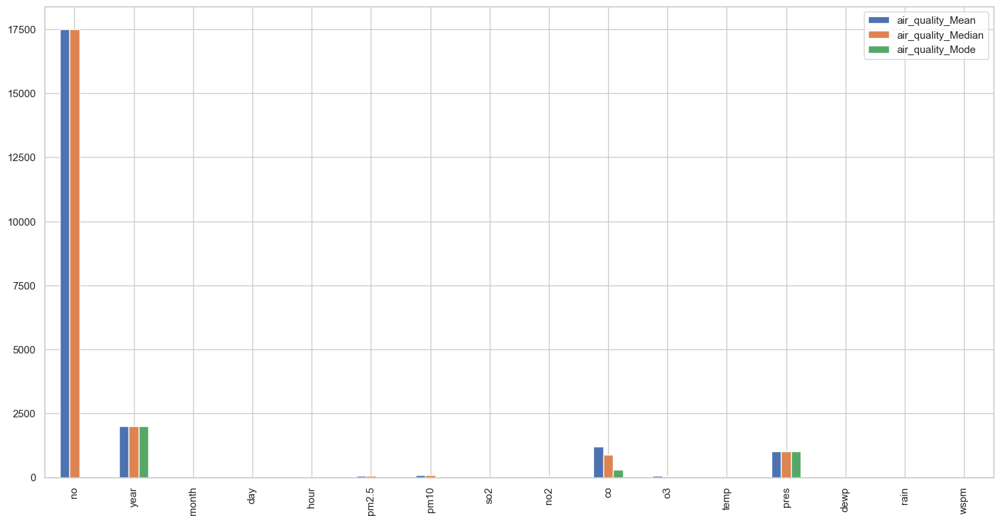

In [33]:
plt.figure(figsize=(18, 9))
sns.set(style="whitegrid")
air_quality_summary_df.plot(kind='bar', figsize=(18, 9))

(array([0. , 0.2, 0.4, 0.6, 0.8, 1. ]),
 [Text(0.0, 0, '0.0'),
  Text(0.2, 0, '0.2'),
  Text(0.4, 0, '0.4'),
  Text(0.6000000000000001, 0, '0.6'),
  Text(0.8, 0, '0.8'),
  Text(1.0, 0, '1.0')])

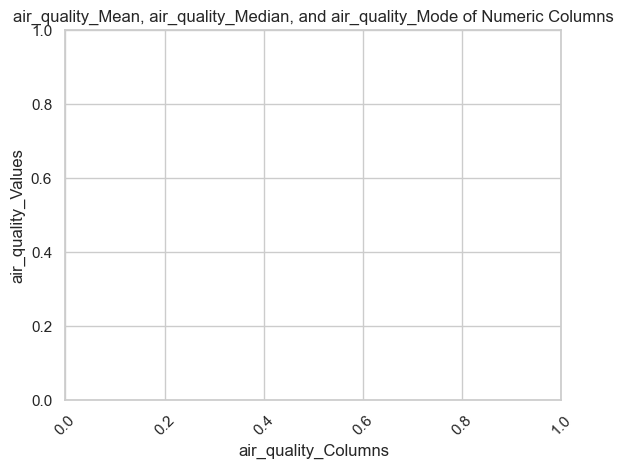

In [34]:
plt.title('air_quality_Mean, air_quality_Median, and air_quality_Mode of Numeric Columns')
plt.ylabel('air_quality_Values')
plt.xlabel('air_quality_Columns')
plt.xticks(rotation=45)

In [35]:
plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

In [36]:
plt.figure(figsize=(18, 9))

<Figure size 1800x900 with 0 Axes>

<Figure size 1800x900 with 0 Axes>

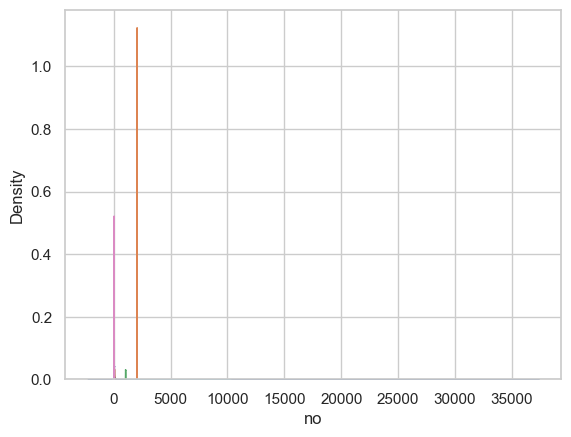

In [37]:
for column in df.select_dtypes(include='number').columns:
    sns.kdeplot(df[column].dropna(), label=column, fill=True, alpha=0.5)

C:\Users\Acer\AppData\Local\Temp\ipykernel_13176\683489987.py:4: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


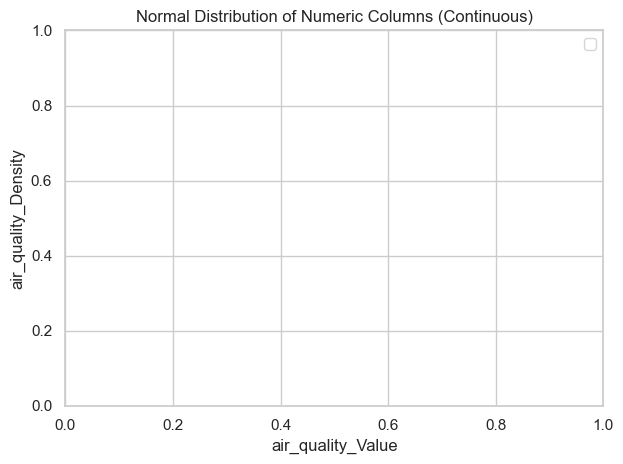

In [38]:
plt.title('Normal Distribution of Numeric Columns (Continuous)')
plt.xlabel('air_quality_Value')
plt.ylabel('air_quality_Density')
plt.legend()
plt.tight_layout()
plt.show()

3. Now plot histograms for discrete values

In [39]:
discrete_columns = df.select_dtypes(include='integer').columns

In [40]:
plt.figure(figsize=(18, 7))

<Figure size 1800x700 with 0 Axes>

<Figure size 1800x700 with 0 Axes>

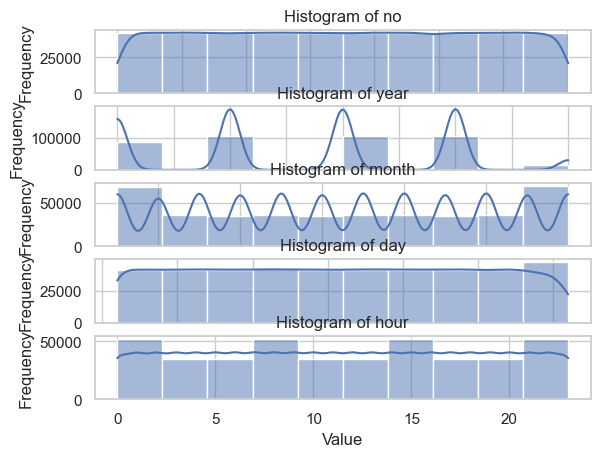

In [41]:
for column in discrete_columns:
    plt.subplot(len(discrete_columns), 1, list(discrete_columns).index(column) + 1)
    sns.histplot(df[column], bins=10, kde=True)  # KDE overlay for better visualization
    plt.title(f'Histogram of {column}')
    plt.xlabel('Value')
    plt.ylabel('Frequency')

In [42]:
plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

4. Combined figure to show continuous and discrete values

In [43]:
plt.figure(figsize=(18, 9))

<Figure size 1800x900 with 0 Axes>

<Figure size 1800x900 with 0 Axes>

Continuous KDE plots

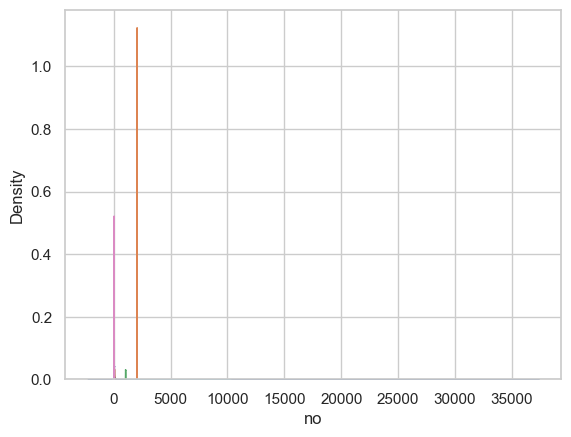

In [44]:
for column in df.select_dtypes(include='number').columns:
    sns.kdeplot(df[column].dropna(), label=f'KDE {column}', fill=True, alpha=0.3)

Discrete histograms

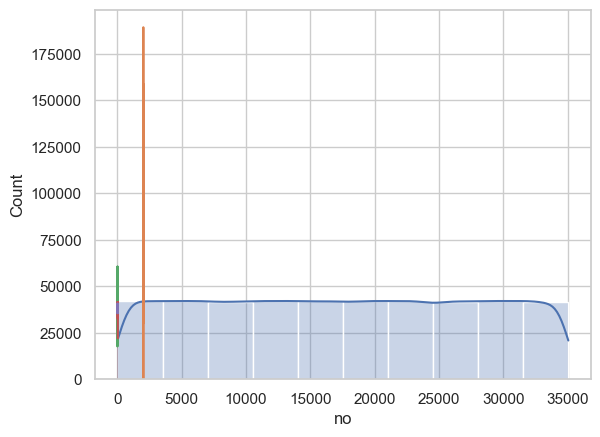

In [45]:
for column in discrete_columns:
    sns.histplot(df[column], bins=10, kde=True, label=f'Histogram {column}', alpha=0.3)

C:\Users\Acer\AppData\Local\Temp\ipykernel_13176\53953976.py:4: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


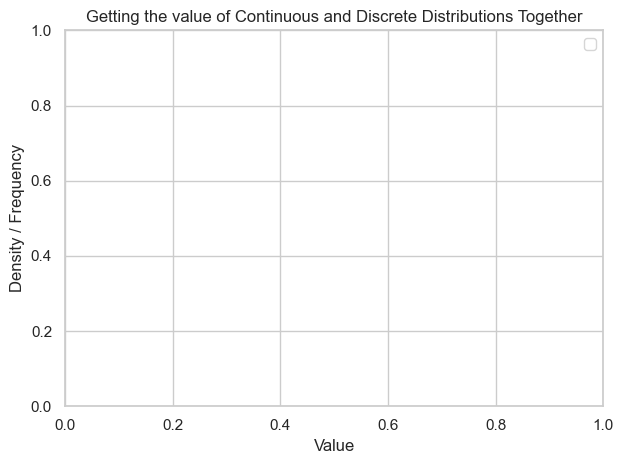

In [46]:
plt.title('Getting the value of Continuous and Discrete Distributions Together')
plt.xlabel('Value')
plt.ylabel('Density / Frequency')
plt.legend()
plt.tight_layout()
plt.show()

find the z-score sitribution of numeric column making more accurate <br>
importing scipy for calculating z-index value

In [47]:
from scipy import stats

In [48]:
air_quality_df = df.apply(pd.to_numeric, errors='coerce')

In [49]:
z_scores_df_air_quality = air_quality_df.apply(lambda x: stats.zscore(x, nan_policy='omit'))

In [50]:
plt.figure(figsize=(18, 9))

<Figure size 1800x900 with 0 Axes>

<Figure size 1800x900 with 0 Axes>

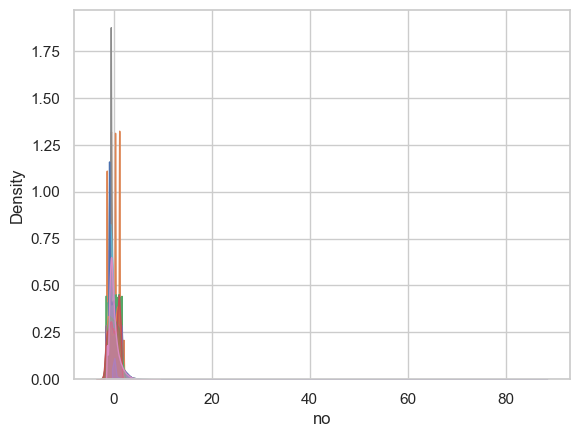

In [51]:
for column in z_scores_df_air_quality.columns:
    sns.kdeplot(z_scores_df_air_quality[column].dropna(), label=f'Z-score {column}', fill=True, alpha=0.5)

C:\Users\Acer\AppData\Local\Temp\ipykernel_13176\1399291174.py:4: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


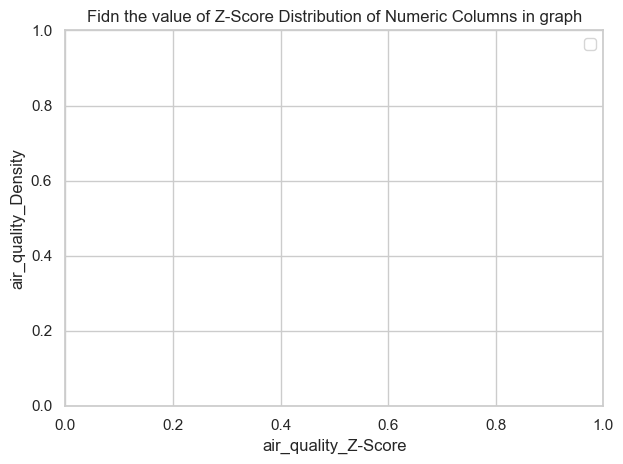

In [52]:
plt.title('Fidn the value of Z-Score Distribution of Numeric Columns in graph')
plt.xlabel('air_quality_Z-Score')
plt.ylabel('air_quality_Density')
plt.legend()
plt.tight_layout()
plt.show()

Data Handling Functions

In [53]:
def load_and_merge_data(file_paths):
    dataframes = [pd.read_csv(file, usecols=lambda x: x not in ['No']) for file in file_paths]
    combined_df = pd.concat(dataframes, ignore_index=True)
    return combined_df

In [54]:
def handle_missing_and_duplicates(df):
    df.fillna(method='ffill', inplace=True)
    df.drop_duplicates(inplace=True)
    return df

In [55]:
def feature_engineering(df):
    if 'date' in df.columns:
        df['date'] = pd.to_datetime(df['date'], errors='coerce')
        df['year'] = df['date'].dt.year
        df['month'] = df['date'].dt.month
        df['season'] = pd.cut(df['month'], bins=[0, 3, 6, 9, 12], labels=['Winter', 'Spring', 'Summer', 'Fall'], right=False)
    return df

In [56]:
def air_quality_data_cleaning(df):
    for col in df.select_dtypes(include=['object']).columns:
        df[col] = df[col].astype('category_type')
    return df

In [57]:
def perform_analysis_and_visualization_air_control(df):
    plt.figure(figsize=(11, 6))
    sns.histplot(df['PM2.5'].dropna(), bins=32)
    plt.title('Distribution of PM2.5 Concentration for air quality control')
    plt.xlabel('PM2.5_value')
    plt.ylabel('Frequency_value')
    plt.xlim([0, df['PM2.5'].max()])
    plt.show()
    if 'air_quality_PM10' in df.columns:
        plt.figure(figsize=(10, 6))
        sns.scatterplot(x='air_quality_PM2.5', y='air_quality_PM10', data=df.dropna(subset=['PM2.5', 'air_quality_PM10']))
        plt.title('Scatter plot of air_quality_PM2.5 vs. air_quality_PM10')
        plt.xlabel('air_quality_PM2.5')
        plt.ylabel('air_quality_PM10')
        plt.show()
    air_quality_numeric_columns = df.select_dtypes(include=[np.number]).columns
    corr_matrix = df[air_quality_numeric_columns].corr()
    plt.figure(figsize=(12, 8))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
    plt.title('air quality Correlation Matrix')
    plt.show()

In [58]:
def air_quality_model_training_and_prediction(df):
    df = df.dropna(subset=['PM2.5'])
    X = df.drop(columns=['PM2.5'])
    y = df['PM2.5']
    X = pd.get_dummies(X, drop_first=True)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    model = RandomForestRegressor(random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    return mse, r2, model

In [59]:
data_value = load_and_merge_data(air_quality_data_set_file_paths)

Data Cleaning and Feature Engineering

In [60]:
data = handle_missing_and_duplicates(data_value)
data = feature_engineering(data)
# data = air_quality_data_cleaning(data)

C:\Users\Acer\AppData\Local\Temp\ipykernel_13176\2314342538.py:2: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


Perform EDA

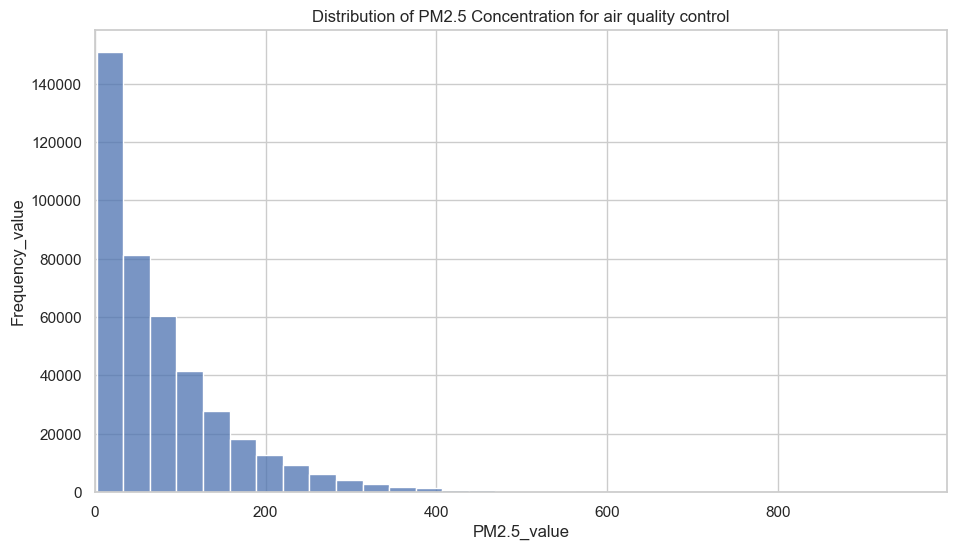

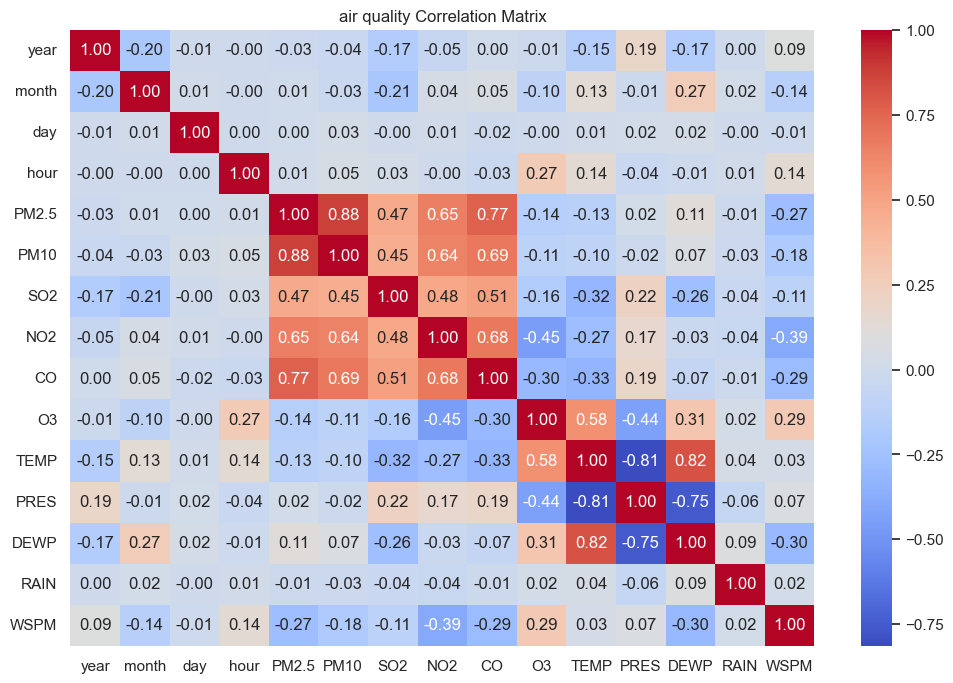

In [61]:
perform_analysis_and_visualization_air_control(data)

Train model and get predictions

In [62]:
mse, r2, model = air_quality_model_training_and_prediction(data)
print(f"Mean Squared Error: {mse:.2f}")
print(f"RÂ² Score: {r2:.2f}")

Mean Squared Error: 327.29
RÂ² Score: 0.95
